In [2]:
!pip install lifetimes
!pip install -U yellowbrick

You should consider upgrading via the 'C:\Users\Admin\anaconda3\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'C:\Users\Admin\anaconda3\python.exe -m pip install --upgrade pip' command.


In [3]:
import pandas as pd
import numpy as np
import math
import json
import seaborn as sns
import datetime
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics

from yellowbrick.cluster.elbow import kelbow_visualizer

from lifetimes.utils import summary_data_from_transaction_data

In [4]:
# read the data folder files
portfolio = pd.read_json('data/portfolio.json', orient='records', lines=True)
profile = pd.read_json('data/profile.json', orient='records', lines=True)
transcript = pd.read_json('data/transcript.json', orient='records', lines=True)

# Data Analysis

In [5]:
profile.head()

,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,None,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [6]:
profile.shape

(17000, 5)

In [7]:
portfolio.head()

,reward,channels,difficulty,duration,offer_type,id
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7


In [8]:
portfolio.shape

(10, 6)

In [9]:
transcript.head()

,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


In [10]:
transcript.shape

(306534, 4)

In [11]:
# convert dates to Datetime
profile['became_member_on'] = pd.to_datetime(profile['became_member_on'], format='%Y%m%d')

# fill empty genders
profile['gender'] = profile['gender'].fillna('NA')

print('Unique genders:')
print(profile['gender'].unique())



Unique genders:
['NA' 'F' 'M' 'O']


In [12]:
profile.describe()

,age,income
count,17000.000000,14825.000000
mean,62.531412,65404.991568
std,26.738580,21598.299410
min,18.000000,30000.000000
25%,45.000000,49000.000000
50%,58.000000,64000.000000
75%,73.000000,80000.000000
max,118.000000,120000.000000


In [13]:
transcript.query('event == "transaction"').head(1)

,person,event,value,time
12654,02c083884c7d45b39cc68e1314fec56c,transaction,{'amount': 0.8300000000000001},0


In [14]:
transcript.query('event == "Offer received"').head(1)

,person,event,value,time


In [15]:
transcript.query('event == "offer viewed"').head(1)

,person,event,value,time
12650,389bc3fa690240e798340f5a15918d5c,offer viewed,{'offer id': 'f19421c1d4aa40978ebb69ca19b0e20d'},0


In [16]:
transcript.query('event == "offer completed"')['value'].iloc[0]

{'offer_id': '2906b810c7d4411798c6938adc9daaa5', 'reward': 2}

In [17]:
transcript['event'].unique()

array(['offer received', 'offer viewed', 'transaction', 'offer completed'],
      dtype=object)

In [18]:
transcript.describe()

,time
count,306534.000000
mean,366.382940
std,200.326314
min,0.000000
25%,186.000000
50%,408.000000
75%,528.000000
max,714.000000


In [19]:
# fill null values 

profile['income_na'] = profile['income'].isna().astype(int)
profile['income'] = profile['income'].fillna(profile['income'].mean())

In [20]:
mlb = MultiLabelBinarizer()
channel_dummies = pd.DataFrame(mlb.fit_transform(portfolio['channels']), columns=mlb.classes_, index=portfolio.index)

offer_type_dummies = portfolio['offer_type'].str.get_dummies()

portfolio = pd.concat([portfolio, channel_dummies, offer_type_dummies], axis=1)


In [21]:
portfolio.head()

,reward,channels,difficulty,duration,offer_type,id,email,mobile,social,web,bogo,discount,informational
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,1,0,0
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1,1,0,0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1,0,0,1
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1,1,0,0
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1,0,1,0


In [22]:
# portfolio.drop(['channels', 'offer_type'], axis=1, inplace=True)

In [23]:
# gender type dummies
profile['year_joined'] = profile['became_member_on'].apply(lambda x: str(x.year))

gender_dummies = profile['gender'].str.get_dummies().add_prefix('gender_')
year_joined_dummies = profile['year_joined'].str.get_dummies().add_prefix('year_joined_')

profile = pd.concat([profile, gender_dummies, year_joined_dummies], axis=1)

#profile.drop(['gender'], axis=1, inplace=True)
profile.drop(['became_member_on'], axis=1, inplace=True)
profile.drop(['year_joined'], axis=1, inplace=True)

profile.head()

,gender,age,id,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018
0,NA,118,68be06ca386d4c31939f3a4f0e3dd783,65404.991568,1,0,0,1,0,0,0,0,0,1,0
1,F,55,0610b486422d4921ae7d2bf64640c50b,112000.000000,0,1,0,0,0,0,0,0,0,1,0
2,NA,118,38fe809add3b4fcf9315a9694bb96ff5,65404.991568,1,0,0,1,0,0,0,0,0,0,1
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,100000.000000,0,1,0,0,0,0,0,0,0,1,0
4,NA,118,a03223e636434f42ac4c3df47e8bac43,65404.991568,1,0,0,1,0,0,0,0,0,1,0


In [24]:
# event dummies
event_dummies = transcript['event'].str.get_dummies()
event_dummies.drop('transaction', axis=1, inplace=True)

transcript = pd.concat([transcript, event_dummies], axis=1)
transcript.rename(columns={'offer completed': 'offer_completed', 'offer received': 'offer_received', 'offer viewed': 'offer_viewed'}, inplace=True)

#profile.drop(['event'], axis=1, inplace=True)

transcript.head()

,person,event,value,time,offer_completed,offer_received,offer_viewed
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0,0,1,0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0,0,1,0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0,0,1,0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0,0,1,0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0,0,1,0


In [25]:
# Split transaction and offer dataframes

transactions = transcript.query('event == "transaction"').copy()
transactions['amount'] = transactions['value'].apply(lambda x: list(x.values())[0])
transactions.drop(['value', 'offer_completed', 'offer_received', 'offer_viewed'], axis=1, inplace=True)

offers = transcript.query('event != "transaction"').copy()
offers['offer_id'] = offers['value'].apply(lambda x: list(x.values())[0])
offers.drop(['value'], axis=1, inplace=True)

In [26]:
# Merge dataframes together 

offers = offers.merge(profile, left_on='person', right_on='id')
offers = offers.merge(portfolio, left_on='offer_id', right_on='id')
offers.drop(['id_x', 'id_y'], axis=1, inplace=True)
offers.set_index('offer_id', inplace=True)
offers.head(2)

,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,income_na,...,difficulty,duration,offer_type,email,mobile,social,web,bogo,discount,informational
offer_id,,,,,,,,,,,,,,,,,,,,,
9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,0,1,0,F,75,100000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6,0,0,1,F,75,100000.0,0,...,5,7,bogo,1,1,0,1,1,0,0


In [27]:
transactions = transactions.merge(profile, left_on='person', right_on='id')
transactions.drop(['event'], axis=1, inplace=True)
transactions.head(2)

,person,time,amount,gender,age,id,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018
0,02c083884c7d45b39cc68e1314fec56c,0,0.83,F,20,02c083884c7d45b39cc68e1314fec56c,30000.0,0,1,0,0,0,0,0,0,1,0,0
1,02c083884c7d45b39cc68e1314fec56c,6,1.44,F,20,02c083884c7d45b39cc68e1314fec56c,30000.0,0,1,0,0,0,0,0,0,1,0,0


# Remove Outliers

In [28]:
profile = profile.query('age <= 99')
offers = offers.query('age <= 99')
transactions = transactions.query('age <= 99')

In [29]:
transactions.describe()

,time,amount,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018
count,123802.000000,123802.000000,123802.000000,123802.000000,123802.0,123802.000000,123802.000000,123802.0,123802.000000,123802.000000,123802.000000,123802.000000,123802.000000,123802.000000,123802.000000
mean,381.255941,13.990337,52.654384,61831.012423,0.0,0.397910,0.587793,0.0,0.014297,0.027528,0.066097,0.141581,0.251660,0.355390,0.157744
std,201.815431,31.767386,17.838467,20656.130481,0.0,0.489469,0.492234,0.0,0.118713,0.163616,0.248453,0.348621,0.433969,0.478633,0.364502
min,0.000000,0.050000,18.000000,30000.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,210.000000,3.660000,39.000000,46000.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,402.000000,10.790000,54.000000,60000.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,552.000000,19.120000,65.000000,74000.000000,0.0,1.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,714.000000,1062.280000,99.000000,120000.000000,0.0,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [30]:
# Explore Repeat offer 

offers.reset_index(inplace=True)

In [31]:
# the same offer can be received and viewed multiple times
offers[offers.duplicated(subset=['offer_id', 'person'], keep=False)].head()

,offer_id,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,...,difficulty,duration,offer_type,email,mobile,social,web,bogo,discount,informational
0,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,0,1,0,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
1,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6,0,0,1,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
2,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer completed,132,1,0,0,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
3,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer received,408,0,1,0,M,68,70000.0,...,5,7,bogo,1,1,0,1,1,0,0
4,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer viewed,420,0,0,1,M,68,70000.0,...,5,7,bogo,1,1,0,1,1,0,0


In [32]:
# add receipt, view and completion time columns
offers['time'] = offers['time'] + 0.5
offers['received_time'] = offers['offer_received'] * offers['time']
offers['viewed_time'] = offers['offer_viewed'] * offers['time']
offers['completed_time'] = offers['offer_completed'] * offers['time']

In [33]:
offers.head()

,offer_id,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,...,email,mobile,social,web,bogo,discount,informational,received_time,viewed_time,completed_time
0,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0.5,0,1,0,F,75,100000.0,...,1,1,0,1,1,0,0,0.5,0.0,0.0
1,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6.5,0,0,1,F,75,100000.0,...,1,1,0,1,1,0,0,0.0,6.5,0.0
2,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer completed,132.5,1,0,0,F,75,100000.0,...,1,1,0,1,1,0,0,0.0,0.0,132.5
3,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer received,408.5,0,1,0,M,68,70000.0,...,1,1,0,1,1,0,0,408.5,0.0,0.0
4,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer viewed,420.5,0,0,1,M,68,70000.0,...,1,1,0,1,1,0,0,0.0,420.5,0.0


In [34]:
# an offer can be received multiple times by the same person
# we'll use first exposure times, but keep track of the number of exposures

offers_mins = offers.groupby(['person', 'offer_id', 'event']).min()
offers_sums = offers.groupby(['person', 'offer_id', 'event'])[['offer_received', 'offer_viewed', 'offer_completed']].sum()

offers_mins.update(offers_sums)

offers_grouped = offers_mins.groupby(['person', 'offer_id']).max().reset_index()

offers_grouped.fillna(0, inplace=True)

In [35]:
offers_grouped.head()

,person,offer_id,time,offer_completed,offer_received,offer_viewed,gender,age,income,income_na,...,email,mobile,social,web,bogo,discount,informational,received_time,viewed_time,completed_time
0,0009655768c64bdeb2e877511632db8f,2906b810c7d4411798c6938adc9daaa5,576.5,1,1,0,M,33,72000.0,0,...,1,1,0,1,0,1,0,576.5,0.0,576.5
1,0009655768c64bdeb2e877511632db8f,3f207df678b143eea3cee63160fa8bed,372.5,0,1,1,M,33,72000.0,0,...,1,1,0,1,0,0,1,336.5,372.5,0.0
2,0009655768c64bdeb2e877511632db8f,5a8bc65990b245e5a138643cd4eb9837,192.5,0,1,1,M,33,72000.0,0,...,1,1,1,0,0,0,1,168.5,192.5,0.0
3,0009655768c64bdeb2e877511632db8f,f19421c1d4aa40978ebb69ca19b0e20d,456.5,1,1,1,M,33,72000.0,0,...,1,1,1,1,1,0,0,408.5,456.5,414.5
4,0009655768c64bdeb2e877511632db8f,fafdcd668e3743c1bb461111dcafc2a4,540.5,1,1,1,M,33,72000.0,0,...,1,1,1,1,0,1,0,504.5,540.5,528.5


# Drop misattributions

In [36]:
offers_grouped['end_time'] = offers_grouped['received_time'] + offers_grouped['duration'] * 24
offers_grouped['viewed_on_time'] = offers_grouped.apply(lambda x: 1 if x['viewed_time'] < x['end_time'] and x['viewed_time'] != 0 else 0, axis=1)
offers_grouped['completed_on_time'] = offers_grouped.apply(lambda x: 1 if x['completed_time'] < x['end_time'] and x['completed_time'] != 0 else 0, axis=1)

# dropping misattributions (completion without view, completion before view, or view before receipt)
offers_grouped = offers_grouped.query('~(completed_time > 0 and viewed_time == 0)')
offers_grouped = offers_grouped.query('~(completed_time != 0 and completed_time < viewed_time)')
offers_grouped = offers_grouped.query('~(viewed_time != 0 and viewed_time < received_time)')

# Recency and Frequency

In [37]:
# time to Datetime
transactions['datetime'] = transactions['time'].apply(lambda x: pd.Timestamp('2000-01-01T12') + pd.Timedelta(hours=x))
transactions.head()

rf = summary_data_from_transaction_data(transactions, 'person', 'datetime', monetary_value_col='amount')
rf.drop('T', axis=1, inplace=True)

profile.rename({'id': 'person'}, axis=1, inplace=True)
profile.set_index('person', inplace=True)

customers = profile.join(rf)
customers.head()

,gender,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018,frequency,recency,monetary_value
person,,,,,,,,,,,,,,,,,
0610b486422d4921ae7d2bf64640c50b,F,55,112000.0,0,1,0,0,0,0,0,0,0,1,0,2.0,21.0,27.750000
78afa995795e4d85b5d9ceeca43f5fef,F,75,100000.0,0,1,0,0,0,0,0,0,0,1,0,5.0,16.0,24.320000
e2127556f4f64592b11af22de27a7932,M,68,70000.0,0,0,1,0,0,0,0,0,0,0,1,1.0,10.0,18.420000
389bc3fa690240e798340f5a15918d5c,M,65,53000.0,0,0,1,0,0,0,0,0,0,0,1,2.0,22.0,13.445000
2eeac8d8feae4a8cad5a6af0499a211d,M,58,51000.0,0,0,1,0,0,0,0,0,0,1,0,3.0,15.0,4.433333


# View and conversion rates

In [38]:
def sum_greater_than_zero(x):
    """Counts non-0 items."""
    return (x > 0).sum()

def mean_greater_than_zero(x):
    """Average non-0 items."""
    return x.replace(0, np.nan).mean() 

# BOGO offers
bogo_performance = offers_grouped.query('offer_type == "bogo"').groupby(['person']).agg(
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),    
)
bogo_performance['bogo_vr'] = bogo_performance['offers_viewed_cnt'] / bogo_performance['offers_received_cnt']
bogo_performance['bogo_cr'] = bogo_performance['offers_completed_cnt'] / bogo_performance['offers_viewed_cnt']
bogo_performance.drop(['offers_viewed_cnt', 'offers_received_cnt', 'offers_completed_cnt'], axis=1, inplace=True)

# discount offers
discount_performance = offers_grouped.query('offer_type == "discount"').groupby(['person']).agg(
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),    
)
discount_performance['discount_vr'] = discount_performance['offers_viewed_cnt'] / discount_performance['offers_received_cnt']
discount_performance['discount_cr'] = discount_performance['offers_completed_cnt'] / discount_performance['offers_viewed_cnt']
discount_performance.drop(['offers_viewed_cnt', 'offers_received_cnt', 'offers_completed_cnt'], axis=1, inplace=True)

# informational offers view rate
informational_performance = offers_grouped.query('offer_type == "informational"').groupby(['person']).agg(
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),    
)
informational_performance['informational_vr'] = informational_performance['offers_viewed_cnt'] / informational_performance['offers_received_cnt']
informational_performance.drop(['offers_viewed_cnt', 'offers_received_cnt', 'offers_completed_cnt'], axis=1, inplace=True)

# all offers conversion rate
total_performance = offers_grouped.query('offer_type != "informational"').groupby(['person']).agg(
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),    
)
total_performance['total_cr'] = total_performance['offers_completed_cnt'] / total_performance['offers_viewed_cnt']
total_performance.drop(['offers_viewed_cnt', 'offers_received_cnt', 'offers_completed_cnt'], axis=1, inplace=True)

customers = customers.join(bogo_performance).join(discount_performance).join(informational_performance).join(total_performance)
customers.fillna(0, inplace=True)
customers.head()

,gender,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,...,year_joined_2018,frequency,recency,monetary_value,bogo_vr,bogo_cr,discount_vr,discount_cr,informational_vr,total_cr
person,,,,,,,,,,,,,,,,,,,,,
0610b486422d4921ae7d2bf64640c50b,F,55,112000.0,0,1,0,0,0,0,0,...,0,2.0,21.0,27.750000,0.0,0.0,0.0,0.0,0.0,0.000000
78afa995795e4d85b5d9ceeca43f5fef,F,75,100000.0,0,1,0,0,0,0,0,...,0,5.0,16.0,24.320000,1.0,1.0,0.0,0.0,1.0,1.000000
e2127556f4f64592b11af22de27a7932,M,68,70000.0,0,0,1,0,0,0,0,...,1,1.0,10.0,18.420000,1.0,1.0,1.0,0.5,0.0,0.666667
389bc3fa690240e798340f5a15918d5c,M,65,53000.0,0,0,1,0,0,0,0,...,1,2.0,22.0,13.445000,1.0,1.0,1.0,1.0,0.0,1.000000
2eeac8d8feae4a8cad5a6af0499a211d,M,58,51000.0,0,0,1,0,0,0,0,...,0,3.0,15.0,4.433333,0.0,0.0,1.0,0.5,0.0,0.500000


In [39]:
customer_offers = offers_grouped.groupby('person').agg(
    reward_avg = ('reward', 'mean'),
    difficulty_avg = ('difficulty', 'mean'),
    email_cnt = ('email', 'sum'),
    mobile_cnt = ('mobile', 'sum'),
    social_cnt = ('social', 'sum'),
    web_cnt = ('web', 'sum'),
    bogo_cnt = ('bogo', 'sum'),
    discount_cnt = ('discount', 'sum'),
    informational_cnt = ('informational', 'sum'),
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),
    exposures_received_avg = ('offer_received', 'mean'),
    exposures_viewed_avg = ('offer_viewed', 'mean'),
    exposures_completed_avg = ('offer_completed', 'mean'),
)

customers = customers.join(customer_offers)

customers.drop(['gender', 'gender_NA', 'income_na'], axis=1, inplace=True)
customers.dropna(inplace=True)

customers.head()

,age,income,gender_F,gender_M,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,...,web_cnt,bogo_cnt,discount_cnt,informational_cnt,offers_received_cnt,offers_viewed_cnt,offers_completed_cnt,exposures_received_avg,exposures_viewed_avg,exposures_completed_avg
person,,,,,,,,,,,,,,,,,,,,,
0610b486422d4921ae7d2bf64640c50b,55,112000.0,1,0,0,0,0,0,0,1,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.000000,0.000000
78afa995795e4d85b5d9ceeca43f5fef,75,100000.0,1,0,0,0,0,0,0,1,...,1.0,2.0,0.0,1.0,3.0,3.0,2.0,1.0,1.000000,0.666667
e2127556f4f64592b11af22de27a7932,68,70000.0,0,1,0,0,0,0,0,0,...,4.0,1.0,2.0,1.0,4.0,3.0,2.0,1.0,0.750000,0.500000
389bc3fa690240e798340f5a15918d5c,65,53000.0,0,1,0,0,0,0,0,0,...,4.0,2.0,2.0,0.0,4.0,4.0,4.0,1.5,1.500000,1.250000
2eeac8d8feae4a8cad5a6af0499a211d,58,51000.0,0,1,0,0,0,0,0,1,...,3.0,0.0,2.0,1.0,3.0,2.0,1.0,1.0,0.666667,0.333333


# Exploratory Data analysis


In [40]:
starbucks = ["#008248", "#604c4c", "#eac784", "#f0cddb", "#6B9997"]
starbucks_d = ["#cce6da", "#66b491", "#008248"]
genders = ["#8700f9", "#00c4a9", "#4462D1"]

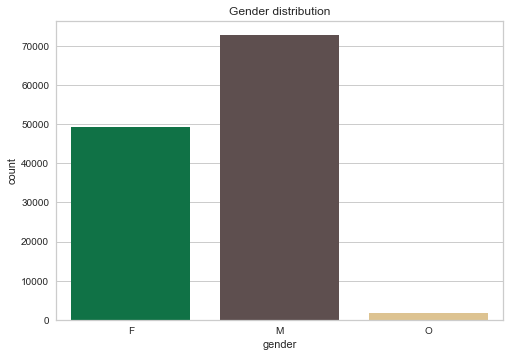

In [41]:
sns.set_palette(sns.color_palette(starbucks))

df = transactions[['gender', 'age', 'amount', 'income']]

ax = sns.countplot(x='gender', data=df)
ax.set_title('Gender distribution');

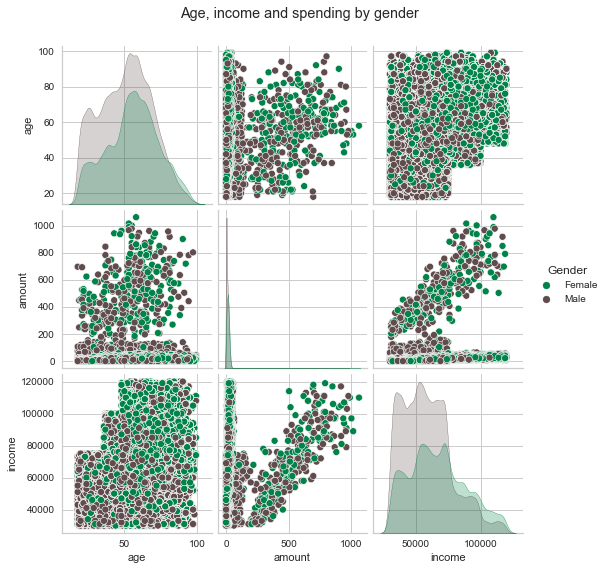

In [42]:
sns.set_palette(sns.color_palette(starbucks))

df = transactions[['gender', 'age', 'amount', 'income']].query('gender in ["F", "M"]')

df.rename(columns={'gender': 'Gender'}, inplace=True)
df['Gender'] = df['Gender'].map({'M': 'Male', 'F': 'Female'})

g = sns.pairplot(df, hue='Gender')
g.fig.suptitle("Age, income and spending by gender", y=1.05);

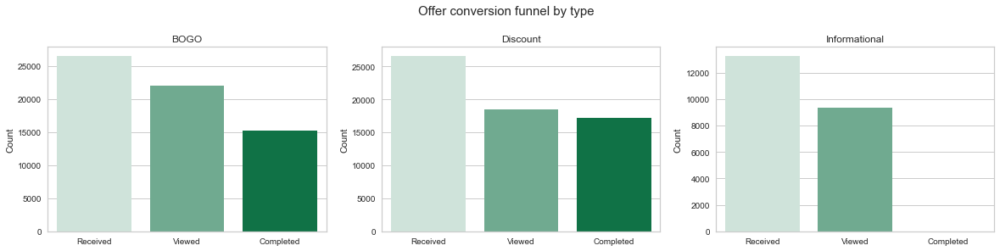

In [43]:
sns.set_palette(sns.color_palette(starbucks))

df = offers.groupby(['event', 'offer_type'])['person'].count().reset_index()
df['event'] = pd.Categorical(df['event'], ["offer received", "offer viewed", "offer completed"])
df.sort_values('event', inplace=True)

fig, axs = plt.subplots(ncols=3, figsize=(20, 4))

df['event'] = df['event'].map({'offer received': 'Received', 'offer viewed': 'Viewed', 'offer completed': 'Completed'})

ax = sns.barplot('event', y='person', data=df.query('offer_type == "bogo"'), palette=starbucks_d, ci=None, ax=axs[0])
ax.set(xlabel='', ylabel='Count', title='BOGO')

ax = sns.barplot('event', y='person', data=df.query('offer_type == "discount"'), palette=starbucks_d, ci=None, ax=axs[1])
ax.set(xlabel='', ylabel='Count', title='Discount')

ax = sns.barplot('event', y='person', data=df.query('offer_type == "informational"'), palette=starbucks_d, ci=None, ax=axs[2])
ax.set(xlabel='', ylabel='Count', title='Informational')

fig.suptitle('Offer conversion funnel by type', size=15, y=1.05);

# Model Building

In [44]:
# feature Scaling 

scaler = StandardScaler().fit(customers)
customers_scaled = scaler.transform(customers)
customers_scaled.std(axis=0)[:5], customers_scaled.mean(axis=0)[:5]

(array([1., 1., 1., 1., 1.]),
 array([-7.40852533e-17, -1.11007220e-16, -5.59862501e-17,  7.28786531e-17,
         3.86112069e-17]))

In [45]:
# PCA for Dimensionality Reduction

pca = PCA()
X_pca = pca.fit_transform(customers_scaled)

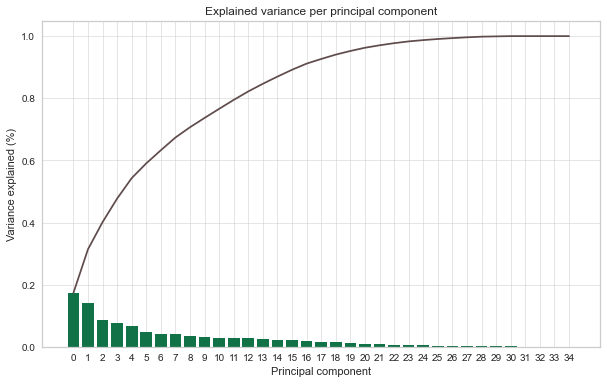

In [46]:
# Scree plot (variance explained by each principal component)
num_components=len(pca.explained_variance_ratio_)
ind = np.arange(num_components)
vals = pca.explained_variance_ratio_
cumvals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, palette=starbucks[:1], ci=None)
ax2 = sns.lineplot(ind, cumvals, color=starbucks[1], ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel("Principal component")
ax.set_ylabel("Variance explained (%)")
plt.title('Explained variance per principal component');

In [47]:
cum_expl_var_ratio = np.cumsum(pca.explained_variance_ratio_)
num_components = len(cum_expl_var_ratio[cum_expl_var_ratio <= 0.8])

# rerun PCA with components that explain 80% of the variance
pca = PCA(num_components).fit(customers_scaled)
X_pca = pca.transform(customers_scaled)
X_pca = pd.DataFrame(X_pca)

np.cumsum(pca.explained_variance_ratio_)

array([0.17314538, 0.31373335, 0.40114049, 0.47706088, 0.54288056,
       0.59044115, 0.6326669 , 0.67356135, 0.70668947, 0.73670467,
       0.7659675 , 0.79475154])

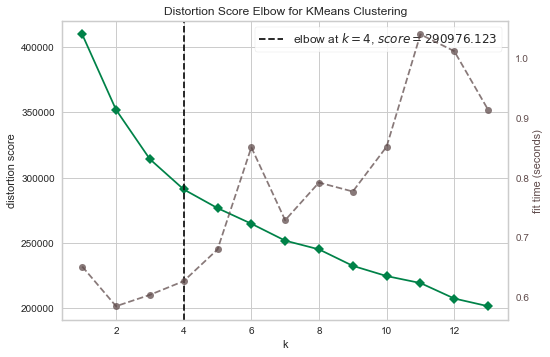

In [48]:
# K means Clustering
# elbow method

kelbow_visualizer(KMeans(), X_pca, k=(1,14));

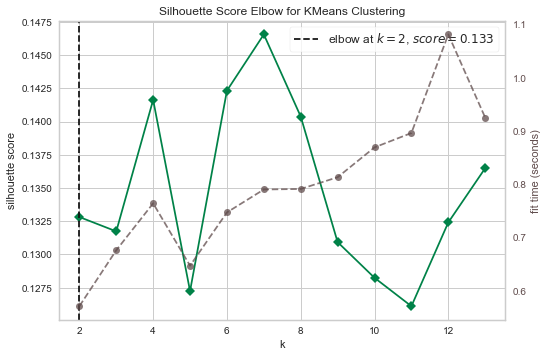

In [49]:
# silhouette method
kelbow_visualizer(KMeans(), X_pca, k=(2,14), metric='silhouette');

In [50]:
model = KMeans(n_clusters=4, random_state=28).fit(X_pca)
kmeans_clusters = model.predict(X_pca)

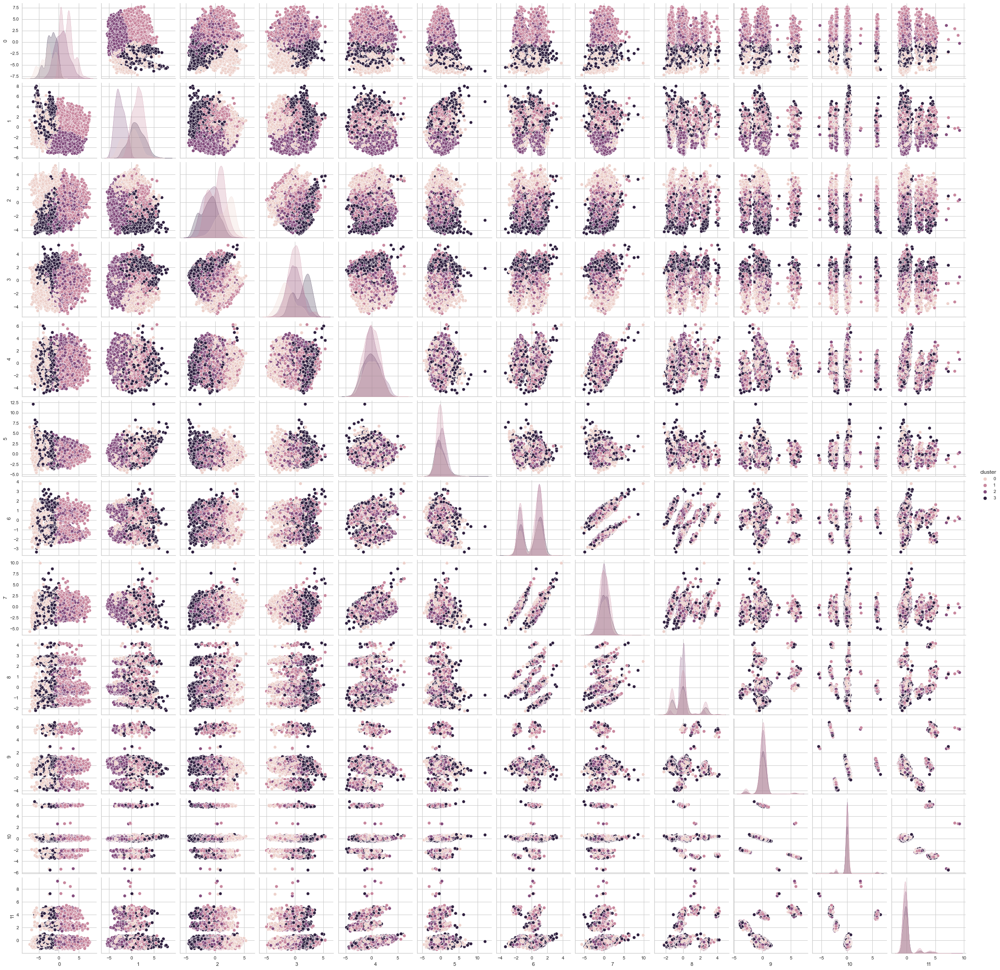

In [51]:
df = X_pca.copy()
df['cluster'] = kmeans_clusters
sns.pairplot(df, hue='cluster')

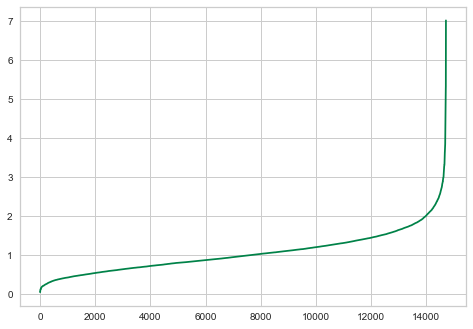

In [52]:
# DBSCAN

neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_pca)
distances, indices = nbrs.kneighbors(X_pca)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [53]:
model =  DBSCAN(eps=2.5, min_samples=150)
dbscan_clusters = model.fit_predict(X_pca)

print("Number of clusters:", len(np.unique(dbscan_clusters)))

Number of clusters: 5


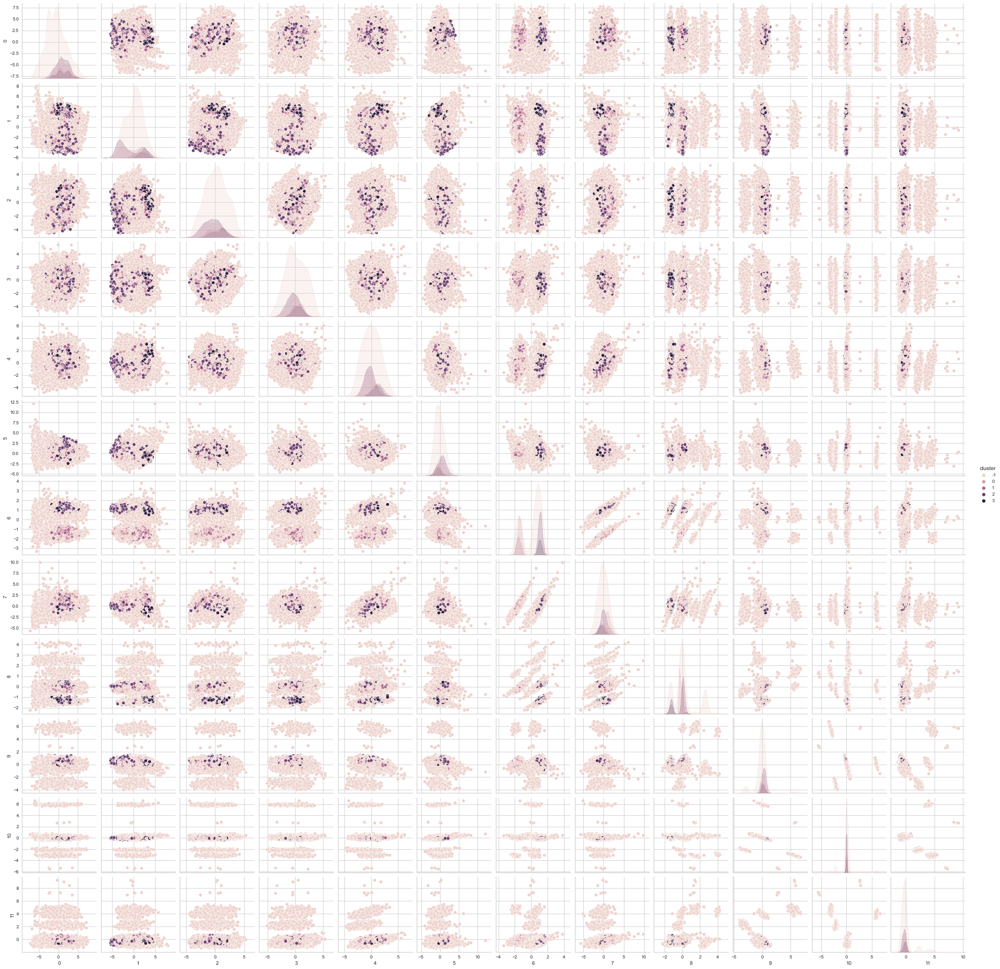

In [54]:
df = X_pca.copy()
df['cluster'] = dbscan_clusters
sns.pairplot(df, hue='cluster')

In [55]:
# Optics

model = OPTICS(min_samples=40)
optics_clusters = model.fit_predict(X_pca)

print("Number of clusters:", len(np.unique(optics_clusters)))

Number of clusters: 4


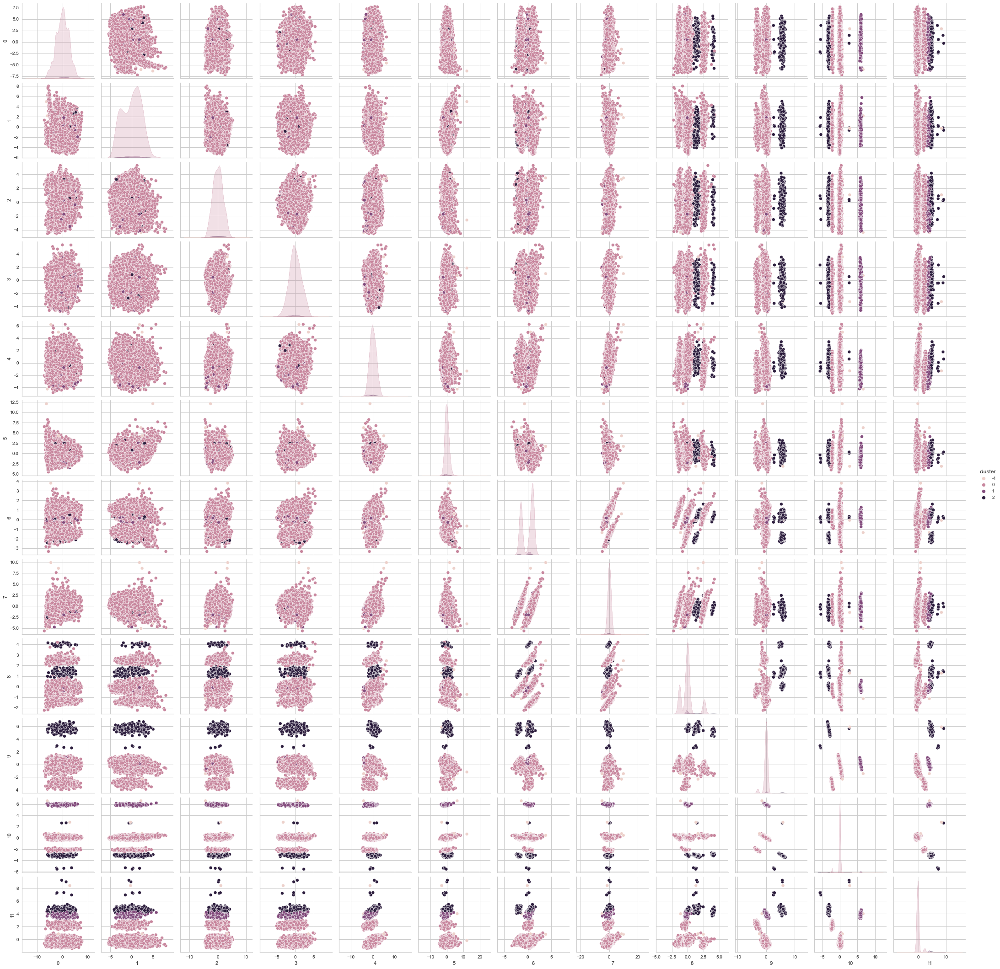

In [56]:
df = X_pca.copy()
df['cluster'] = optics_clusters
sns.pairplot(df, hue='cluster')

# Evaluation

In [57]:
# Optics

df = customers.copy().reset_index()
df['cluster'] = optics_clusters
df = df.melt(id_vars=['person', 'cluster'])
df = df.query('cluster != -1').groupby(['cluster', 'variable']).mean().reset_index()
df.head()

,cluster,variable,value
0,0,age,54.367186
1,0,bogo_cnt,1.244627
2,0,bogo_cr,0.442056
3,0,bogo_vr,0.741800
4,0,difficulty_avg,7.170924


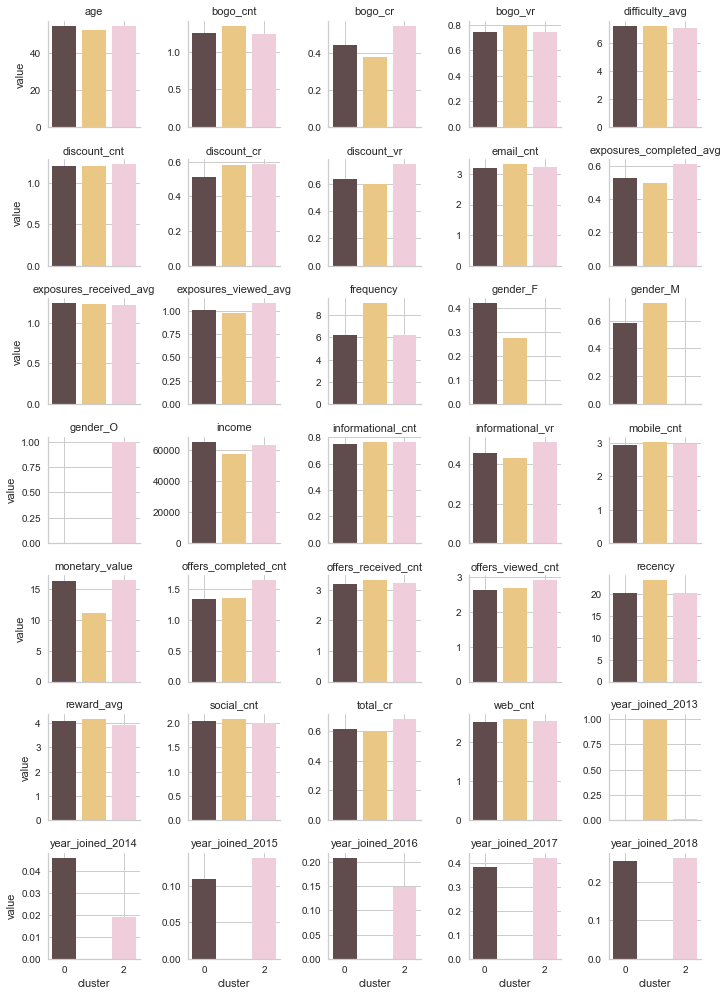

In [58]:
g = sns.FacetGrid(df, col='variable', hue='cluster', palette=starbucks[1:], col_wrap=5, height=2, sharey=False)
g = g.map(plt.bar, 'cluster', 'value').set_titles("{col_name}");

In [59]:
# K means

df = customers.copy().reset_index()
df['cluster'] = kmeans_clusters
df = df.melt(id_vars=['person', 'cluster'])
df = df.query('cluster != -1').groupby(['cluster', 'variable']).mean().reset_index()
df.head()

,cluster,variable,value
0,0,age,55.647368
1,0,bogo_cnt,0.098496
2,0,bogo_cr,0.000000
3,0,bogo_vr,0.020301
4,0,difficulty_avg,6.399029


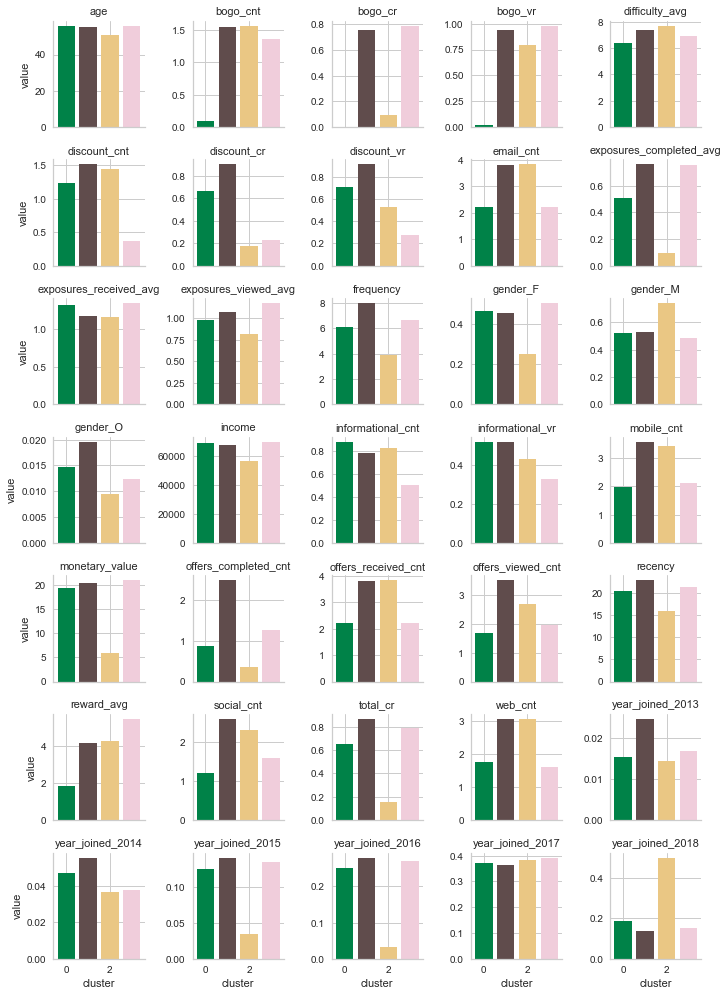

In [60]:
g = sns.FacetGrid(df, col='variable', hue='cluster', palette=starbucks, col_wrap=5, height=2, sharey=False)
g = g.map(plt.bar, 'cluster', 'value').set_titles("{col_name}");

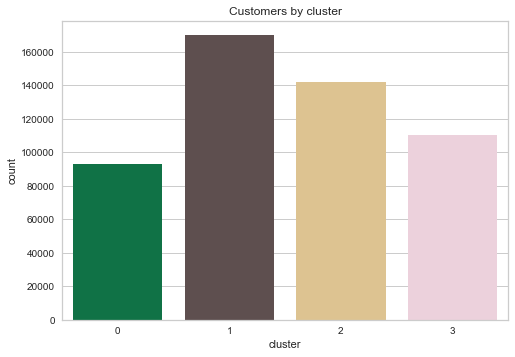

In [61]:
# plot total number of customers per cluster
df = customers.copy().reset_index()
df['cluster'] = kmeans_clusters
df = df.melt(id_vars=['person', 'cluster'])
df.head()

ax = sns.countplot(x='cluster', data=df)
ax.set_title('Customers by cluster');